In [1]:
%load_ext autoreload
%autoreload 2

import yaml

from pipeline.pipeline import Pipeline
from scoring.spatial_graph import retrieve_best_action_object

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
path_config = '/teamspace/studios/this_studio/letsdoit/config/config_dev.yml'

In [3]:
with open(path_config, 'r') as file:
    cfg = yaml.safe_load(file)

In [4]:
pipe = Pipeline(**cfg)

Initializing ClipRetriver...


Initializing the MasksFinder...
final text_encoder_type: bert-base-uncased


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


<All keys matched successfully>
Initializing MasksMerger...
Initializing ClipModel...
Initializing ClipProcessor...
Done!


In [5]:
instruction_list = pipe.instruction_list
instruction_block = instruction_list[0]

In [6]:
visit_id = str(instruction_block['visit_id'])

# load the point cloud
pipe.pcd = pipe.loader.load_pcd(visit_id)
# load image_paths, poses, depth_paths, etc.
dict_data = pipe._load_data(visit_id)
# load image_features
image_features_path = pipe.loader.get_image_features_path(visit_id)
pipe.retriever.update_image_features(image_features_path) 

object_labels = instruction_block['all_objects']
instructions = instruction_block['instructions']

objects = []
for object_label in [object_labels[0]]:
    print(f"Extracting objects for '{object_label}'")
    objects.extend(pipe._get_objects_3d(object_label, dict_data))

for instruction in instructions:
    action_object = retrieve_best_action_object(instruction, objects)


Loading rgb frames from visit 420683 and video 42445132: 100%|██████████| 159/159 [00:00<00:00, 145387.91it/s]
Loading rgb frames from visit 420683 and video 42445135: 100%|██████████| 174/174 [00:00<00:00, 167618.03it/s]
Loading rgb frames from visit 420683 and video 42445137: 100%|██████████| 440/440 [00:00<00:00, 205420.05it/s]
Loading depth frames from visit 420683 and video 42445132: 100%|██████████| 159/159 [00:00<00:00, 177271.22it/s]
Loading depth frames from visit 420683 and video 42445135: 100%|██████████| 174/174 [00:00<00:00, 172043.59it/s]
Loading depth frames from visit 420683 and video 42445137: 100%|██████████| 440/440 [00:00<00:00, 207966.39it/s]


Extracting objects for 'knob'


Extracting the masks:   0%|          | 0/10 [00:00<?, ?it/s]/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/transformers/modeling_utils.py:768: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/torch/utils/checkpoint.py:460: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/torch/utils/checkpoint.py:90: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(
Denoising point clouds: 100%|██████████| 16/16 [00

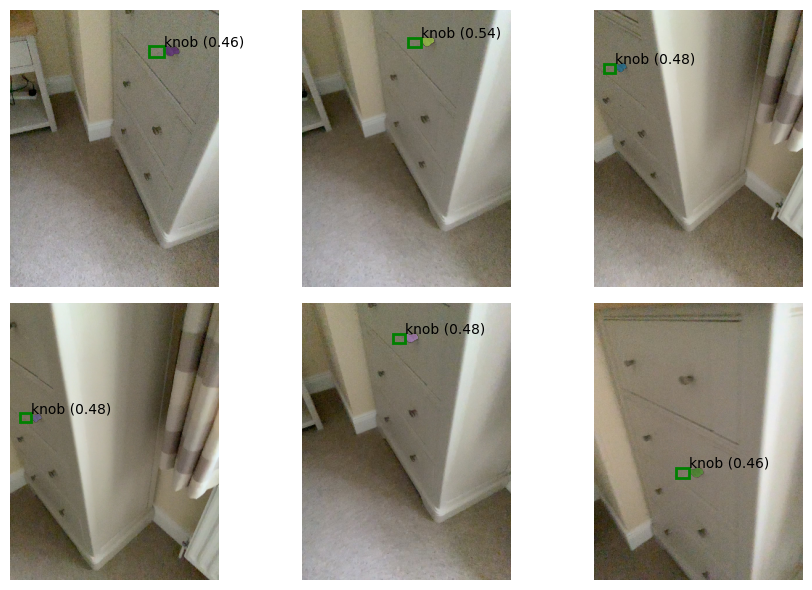

In [7]:
objects[0].plot_2d()

In [14]:
objects[0]._pcd_points = None

In [15]:
objects[0].pcd_points

(3, 451)


array([[ 0.16044856,  0.16043077,  0.23121406, ...,  0.2401376 ,
         0.24012462,  0.2371898 ],
       [ 4.22584879,  4.22593078,  4.19468305, ...,  4.18892587,
         4.18882225,  4.16812557],
       [-0.68711283, -0.69278896, -0.75061669, ..., -0.69603046,
        -0.69093409, -0.73261015]])

In [16]:
objects[0].plot_pcd()

In [34]:
import json
from scoring.primitive import get_primitive, SpatialPrimitive

In [19]:
with open('/teamspace/studios/this_studio/letsdoit/sample_instructions.json') as f:
    instruction_list = json.load(f)

In [29]:
def check_primitive_exists(primitive_name):
    if get_primitive(primitive_name) is None: return False
    return True

In [42]:
for instruction_block in instruction_list:
    instructions = instruction_block['instructions']
    for instruction in instructions:
        spatial_ps = instruction['spatial_primitives']
        for sp in spatial_ps:
            primitive_name = sp['primitive']
            primitive = get_primitive(primitive_name)
            if primitive is None:
                print(f'DANGER! The instruction {instruction["desc_id"]} has a non-existing primitive: {primitive_name}')
            else:
                if primitive == SpatialPrimitive.BETWEEN:
                    if not sp.get('reference_object_2'):
                        print(f'DANGER! The instruction {instruction["desc_id"]} has a "between" primitive that is lacking the reference_object_2')

        

{'primitive': 'between', 'target_object': 'cabinet', 'reference_object': 'window', 'reference_object_2': 'bed'}
